In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scienceplots

In [4]:
df = pd.read_csv("data/final_dataset.csv")
df

,utt_id,maya,spk_id,path
0,spk_001_utt_0001,baach,spk_001,audios/spk_001_utt_0001.wav
1,spk_001_utt_0002,chiich,spk_001,audios/spk_001_utt_0002.wav
2,spk_001_utt_0003,ch'íich',spk_001,audios/spk_001_utt_0003.wav
3,spk_001_utt_0004,ja',spk_001,audios/spk_001_utt_0004.wav
4,spk_001_utt_0005,kool,spk_001,audios/spk_001_utt_0005.wav
...,...,...,...,...
2530,spk_032_utt_0223,jumpuul osea ma jumpuuli cada administración p...,spk_032,audios/spk_032_utt_0223.wav
2531,spk_032_utt_0224,como to'on láaj explicado to'on beeta'an to'on...,spk_032,audios/spk_032_utt_0224.wav
2532,spk_032_utt_0225,le ku xkáakpachtiko'obe ma tu pak'o'obi ma tu ...,spk_032,audios/spk_032_utt_0225.wav
2533,spk_032_utt_0226,teen xan man ti'ob weye camionadasil arroz kin...,spk_032,audios/spk_032_utt_0226.wav


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call
from scipy.stats import gaussian_kde
import pandas as pd

# ─────────────────────────────────────────────────────────────────
# 1. Funciones para extraer F0, F1, F2
# ─────────────────────────────────────────────────────────────────

def extract_formants(audio_path, max_formant=5500, time_step=0.01):
    """
    Extrae F0, F1 y F2 frame a frame usando Parselmouth/Praat.
    Devuelve tres arrays: tiempos, f0, f1, f2
    """
    snd = parselmouth.Sound(audio_path)

    # F0 con el algoritmo autocorrelación de Praat
    pitch = snd.to_pitch(time_step=time_step, pitch_floor=60, pitch_ceiling=400)
    pitch_times  = pitch.xs()
    pitch_values = pitch.selected_array['frequency']
    pitch_values[pitch_values == 0] = np.nan  # frames no sonoros → NaN

    # Formantes F1 y F2 con Burg
    formant = call(snd, "To Formant (burg)", time_step, 5, max_formant, 0.025, 50)
    f1 = np.array([call(formant, "Get value at time", 1, t, 'Hertz', 'Linear')
                   for t in pitch_times])
    f2 = np.array([call(formant, "Get value at time", 2, t, 'Hertz', 'Linear')
                   for t in pitch_times])

    return pitch_times, pitch_values, f1, f2


def draw_spectrogram(ax, spectrogram, dynamic_range=80):
    X, Y = spectrogram.x_grid(), spectrogram.y_grid()
    sg_db = 10 * np.log10(spectrogram.values)
    ax.pcolormesh(X, Y, sg_db, vmin=sg_db.max() - dynamic_range, cmap='Greys')
    ax.set_ylim([spectrogram.ymin, spectrogram.ymax])
    ax.set_xlabel("Tiempo (s)")
    ax.set_ylabel("Frecuencia (Hz)")

In [6]:
# ── Calcula y guarda ──────────────────────────────────────────────────────────
# Filtra las utterances que quieres procesar
utt_ids = df['utt_id'].tolist()

## Guardar formantes, si no los tienes

In [7]:
from pathlib import Path

def download_formants():
    output_path = "./features/formants.npz"
    Path("./features").mkdir(exist_ok=True)

    results = {}

    for utt_id in utt_ids:
        audio_path = f"./audios/{utt_id}.wav"
        print(f"Procesando {utt_id}...", end=' ')
        try:
            times, f0, f1, f2 = extract_formants(audio_path)
            # Guardamos los 4 arrays bajo la clave utt_id
            results[f"{utt_id}_times"] = times
            results[f"{utt_id}_f0"]    = f0
            results[f"{utt_id}_f1"]    = f1
            results[f"{utt_id}_f2"]    = f2
            print("✓")
        except Exception as e:
            print(f"✗ {e}")

    np.savez(output_path, **results)
    print(f"\nGuardado en {output_path}")

#download_formants()

In [8]:
data = np.load("./features/formants.npz", allow_pickle=True)

/tmp/ipykernel_11396/46313931.py:37: RuntimeWarning: divide by zero encountered in log10
  sg_db = 10 * np.log10(spectrogram.values)


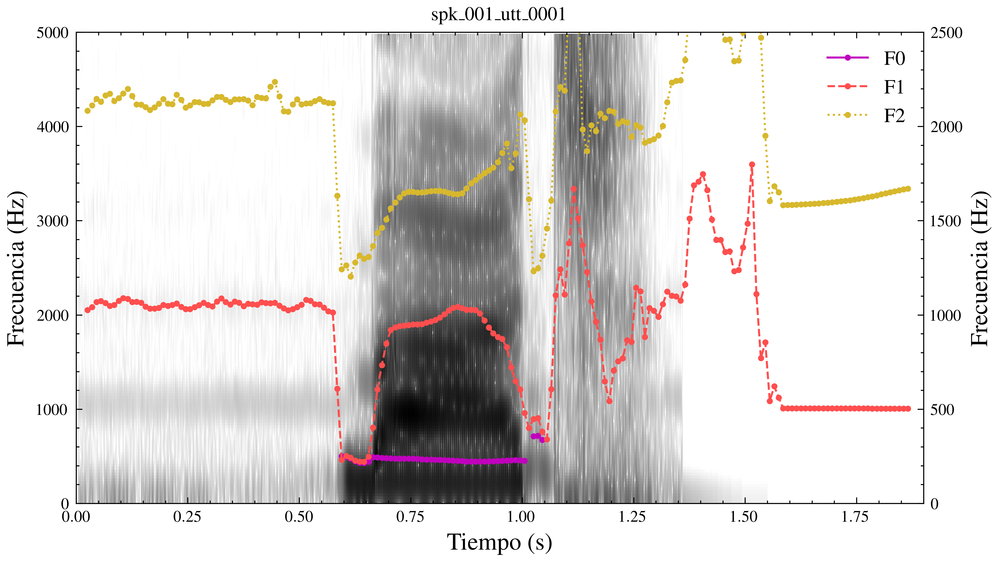

In [9]:
# ─────────────────────────────────────────────────────────────────
# 2. Espectrograma + F0, F1, F2 superpuestos (una utterance)
# ─────────────────────────────────────────────────────────────────

audio_path = "./audios/" + df.loc[0, 'utt_id'] + ".wav"
snd         = parselmouth.Sound(audio_path)
spectrogram = snd.to_spectrogram()

utt_id = df.loc[0, 'utt_id']
pitch_times, f0, f1, f2 = data[f"{utt_id}_times"], data[f"{utt_id}_f0"], data[f"{utt_id}_f1"], data[f"{utt_id}_f2"]

with plt.style.context(['science', 'ieee']):
    fig, ax1 = plt.subplots(figsize=(7, 4))

    # Fondo: espectrograma
    draw_spectrogram(ax1, spectrogram)
    ax1.set_xlim([snd.xmin, snd.xmax])
    ax1.set_ylabel("Frecuencia (Hz)", fontsize=12)
    ax1.set_xlabel("Tiempo (s)", fontsize=12)
    ax1.set_title(f'{df.loc[0, "utt_id"]}')

    # Encima: F0, F1, F2 con eje Y propio
    ax2 = ax1.twinx()
    ax2.plot(pitch_times, f0,   color="#C100BE",  label='F0', marker="o", markersize=2)
    ax2.plot(pitch_times, f1, color="#FF4E4E", label='F1', marker="o", markersize=2)
    ax2.plot(pitch_times, f2, color="#D7B82D", label='F2', marker="o", markersize=2)
    ax2.set_ylabel("Frecuencia (Hz)", fontsize=12)
    ax2.set_ylim(0, 2500)  # cubre F0 (~60-400) + F1 (~300-1000) + F2 (~800-3000)
    ax2.legend(loc='upper right', fontsize=10, framealpha=0.5)

    plt.tight_layout()
    plt.savefig("./figures/spectrogram_formants.png", bbox_inches='tight', pad_inches=0)
    plt.show()

/tmp/ipykernel_11396/46313931.py:37: RuntimeWarning: divide by zero encountered in log10
  sg_db = 10 * np.log10(spectrogram.values)


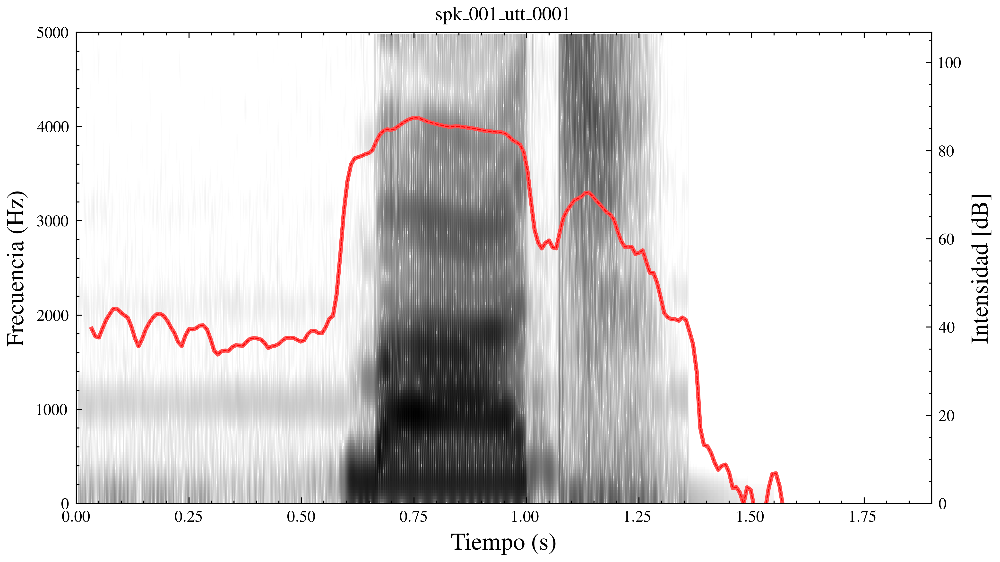

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth.praat import call

def draw_intensity(intensity, ax):
    ax.plot(intensity.xs(), intensity.values.T, linewidth=2, color='#FF4E4E')
    ax.plot(intensity.xs(), intensity.values.T, linewidth=0.5)
    ax.grid(False)
    ax.set_ylim(0)
    ax.set_ylabel("Intensidad [dB]", fontsize=12)

with plt.style.context(['science', 'ieee']):
    audio_path = "./audios/" + df.loc[0, 'utt_id'] + ".wav"
    snd = parselmouth.Sound(audio_path)

    spectrogram = snd.to_spectrogram()
    intensity   = snd.to_intensity()

    fig, ax1 = plt.subplots(figsize=(7, 4))

    plt.sca(ax1)
    draw_spectrogram(ax1, spectrogram, dynamic_range=80)
    ax1.set_ylabel("Frecuencia (Hz)", fontsize=12)
    ax1.set_xlabel("Tiempo (s)", fontsize=12)

    ax2 = ax1.twinx()
    plt.sca(ax2)
    draw_intensity(intensity, ax2)
    ax1.set_xlim([snd.xmin, snd.xmax])
    ax1.set_title(f'{df.loc[0, "utt_id"]}')

    plt.tight_layout()
    plt.savefig("./figures/spectrogram_intensity.png", bbox_inches='tight', pad_inches=0)
    plt.show()

In [11]:
# ── Merge para tener sexo en df ───────────────────────────────────────────────
df_spk = pd.read_csv("data/spk_metadata.csv")
df_merged = df.merge(df_spk[['spk_id', ' sexo']], on='spk_id', how='left')
df_merged

,utt_id,maya,spk_id,path,sexo
0,spk_001_utt_0001,baach,spk_001,audios/spk_001_utt_0001.wav,mujer
1,spk_001_utt_0002,chiich,spk_001,audios/spk_001_utt_0002.wav,mujer
2,spk_001_utt_0003,ch'íich',spk_001,audios/spk_001_utt_0003.wav,mujer
3,spk_001_utt_0004,ja',spk_001,audios/spk_001_utt_0004.wav,mujer
4,spk_001_utt_0005,kool,spk_001,audios/spk_001_utt_0005.wav,mujer
...,...,...,...,...,...
2530,spk_032_utt_0223,jumpuul osea ma jumpuuli cada administración p...,spk_032,audios/spk_032_utt_0223.wav,hombre
2531,spk_032_utt_0224,como to'on láaj explicado to'on beeta'an to'on...,spk_032,audios/spk_032_utt_0224.wav,hombre
2532,spk_032_utt_0225,le ku xkáakpachtiko'obe ma tu pak'o'obi ma tu ...,spk_032,audios/spk_032_utt_0225.wav,hombre
2533,spk_032_utt_0226,teen xan man ti'ob weye camionadasil arroz kin...,spk_032,audios/spk_032_utt_0226.wav,hombre


In [12]:
all_pitches_by_sex = {}

for _, row in df_merged.iterrows():
    utt_id = row['utt_id']
    f0_vals = data[f"{utt_id}_f0"]
    voiced  = f0_vals[~np.isnan(f0_vals)]
    sexo    = row[' sexo'].strip()  # por si tiene espacios como en tu df_spk
    all_pitches_by_sex.setdefault(sexo, []).extend(voiced.tolist())

# ── Paleta por sexo ───────────────────────────────────────────────────────────
sex_colors = {
    'mujer': "#FFC045",
    'hombre':  '#0A91AB',
}

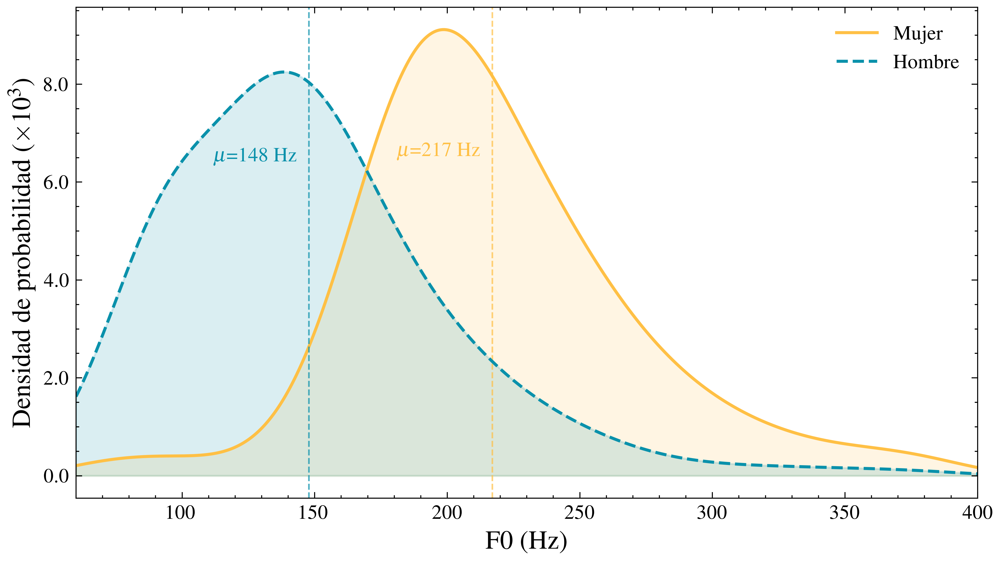

In [13]:
with plt.style.context(['science', 'ieee']):
    fig, ax = plt.subplots(figsize=(7, 4))

    for sexo, pitches in all_pitches_by_sex.items():
        pitches = np.array(pitches)
        pitches = pitches[~np.isnan(pitches)]
        if len(pitches) < 10:
            continue

        color = sex_colors.get(sexo, '#999999')
        kde   = gaussian_kde(pitches, bw_method=0.3)
        x     = np.linspace(60, 400, 500)

        ax.plot(x, kde(x), label=sexo.capitalize(), color=color, linewidth=1.5)
        ax.fill_between(x, kde(x), alpha=0.15, color=color)

        # Línea vertical en la media
        mean_val = np.mean(pitches)
        ax.axvline(mean_val, color=color, linestyle='--', linewidth=0.8, alpha=0.7)
        ax.text(mean_val - 36, kde(mean_val) * 0.8,
                f'$\\mu$={mean_val:.0f} Hz', color=color, fontsize=10)

    ax.set_xlabel('F0 (Hz)', fontsize=13)
    
    # Ticks más grandes
    ax.tick_params(labelsize=10)

    # Notación del eje Y en escala x10^-3 o similar
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x*1000:.1f}'))
    ax.set_ylabel(r'Densidad de probabilidad ($\times 10^{3}$)', fontsize=13)

    ax.legend(fontsize=10, framealpha=0.5)
    ax.set_xlim(60, 400)

    plt.tight_layout()
    plt.savefig("./figures/f0_distribucion_sexo.svg", bbox_inches='tight', pad_inches=0)
    plt.show()

## Clustering - curvas F1/F2

In [14]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse

def calculate_segments_formants(spk_id):
    df_sel  = df_merged[df_merged['spk_id'] == spk_id]
    sexo = df_sel[" sexo"].unique()

    all_rows = []

    for _, row in df_sel.iterrows():
        utt_id     = row['utt_id']
        times      = data[f"{utt_id}_times"]
        f0_vals    = data[f"{utt_id}_f0"]
        f1_vals    = data[f"{utt_id}_f1"]
        f2_vals    = data[f"{utt_id}_f2"]
        sexo       = row[" sexo"]

        voiced_mask = ~np.isnan(f0_vals)
        voiced_idx  = np.where(voiced_mask)[0]

        if len(voiced_idx) == 0:
            continue

        breaks = np.where(np.diff(voiced_idx) > 1)[0]
        region_boundaries = np.split(voiced_idx, breaks + 1)

        for region in region_boundaries:
            if len(region) < 4:
                continue

            t_start  = times[region[0]]
            t_end    = times[region[-1]]
            duration = t_end - t_start

            if duration < 0.04:
                continue

            mid_start = int(len(region) * 0.35)
            mid_end   = int(len(region) * 0.65)
            core      = region[mid_start:mid_end]

            f1_mean = np.nanmean(f1_vals[core])
            f2_mean = np.nanmean(f2_vals[core])

            if np.isnan(f1_mean) or np.isnan(f2_mean):
                continue
            if not (200 < f1_mean < 1200):
                continue
            if not (500 < f2_mean < 3500):
                continue

            all_rows.append({
                'utt_id':   utt_id,
                'inicio':   round(t_start, 4),
                'fin':      round(t_end,   4),
                'duracion': round(duration, 4),
                'F1':       round(f1_mean, 2),
                'F2':       round(f2_mean, 2),
                "sexo":     sexo
            })

    return pd.DataFrame(all_rows), sexo

In [30]:
from scipy.spatial import ConvexHull

with plt.style.context(['science', 'ieee']):
    spks = df["spk_id"].unique()
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))
    axes = axes.flatten()

    for i, spk_id in enumerate(spks):
        ax = axes[i]
        df_formants, sexo = calculate_segments_formants(spk_id)

        ax.scatter(df_formants['F2'], df_formants['F1'],
                   s=15, alpha=0.5, color=sex_colors[sexo], linewidths=0)

        ax.set_ylim(100, 1300)
        ax.set_xlim(500, 3100)
        ax.invert_xaxis()
        ax.invert_yaxis()
        ax.text(0.70, 0.06, spk_id, transform=ax.transAxes, size=12)
        ax.tick_params(labelsize=17)

        if i % 8 != 0:
            ax.set_yticklabels([])
        if i < 24:
            ax.set_xticklabels([])

    fig.text(0.5, 0.01, 'F2 (Hz)', ha='center', fontsize=25)
    fig.text(0.01, 0.5, 'F1 (Hz)', va='center', rotation='vertical', fontsize=25)
    #fig.suptitle('Espacio vocálico por hablante', fontsize=13, y=1.01)

    plt.tight_layout(rect=[0.03, 0.03, 1, 1])
    plt.savefig("./figures/vowel_space_comparison.svg", bbox_inches='tight')
    plt.show()

In [16]:
df_formants, _ = calculate_segments_formants("spk_002")
df_formants

,utt_id,inicio,fin,duracion,F1,F2,sexo
0,spk_002_utt_0001,0.595,0.645,0.05,762.94,1553.46,hombre
1,spk_002_utt_0002,0.595,0.745,0.15,815.75,1633.89,hombre
2,spk_002_utt_0002,0.835,0.955,0.12,806.74,1517.25,hombre
3,spk_002_utt_0004,0.555,0.975,0.42,846.75,1506.13,hombre
4,spk_002_utt_0005,0.625,0.795,0.17,836.05,1517.56,hombre
...,...,...,...,...,...,...,...
363,spk_002_utt_0154,1.020,1.090,0.07,427.16,2167.17,hombre
364,spk_002_utt_0155,0.525,0.825,0.30,453.37,1936.82,hombre
365,spk_002_utt_0155,0.985,1.135,0.15,559.75,1856.13,hombre
366,spk_002_utt_0155,1.245,1.345,0.10,418.41,1818.03,hombre


In [17]:

X      = df_formants[['F1', 'F2']].values
scaler = StandardScaler()
X_sc   = scaler.fit_transform(X)

In [18]:
from sklearn.metrics import calinski_harabasz_score, silhouette_score, davies_bouldin_score

metrics = {
    "inercias": [],
    "sil": [],
    "cal": [],
    "dav": [],
}
K = list(range(2,11))
for k in K:
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(X_sc)

    # Metrics
    metrics["inercias"].append(km.inertia_)
    metrics["sil"].append(silhouette_score(X_sc, labels, metric="euclidean"))
    metrics["cal"].append(calinski_harabasz_score(X_sc, labels))
    metrics["dav"].append(davies_bouldin_score(X_sc, labels))


In [19]:
metrics["cal"][3], metrics["sil"][3], metrics["dav"][3]

(435.00339924746044, 0.4068514702889651, 0.8324001342585714)

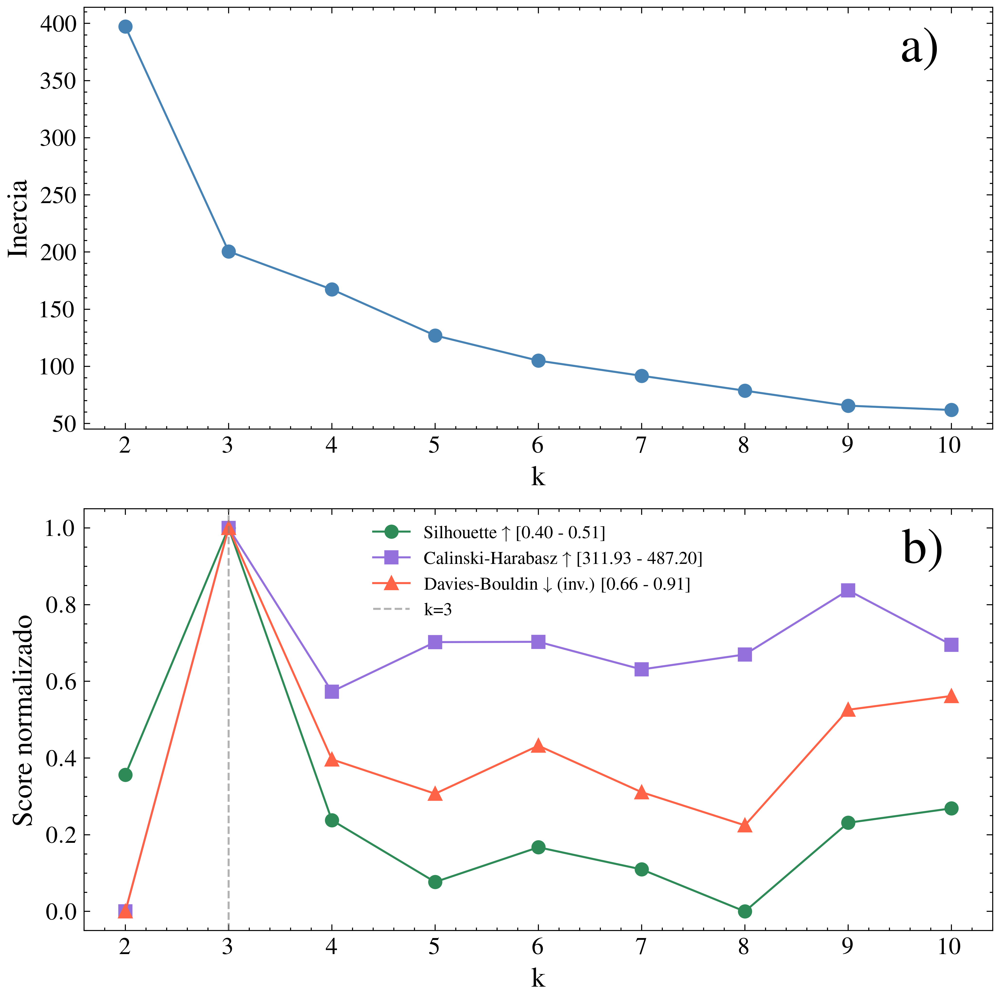

In [20]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Normalizar todo a [0, 1]
def norm(x):
    x = np.array(x)
    min = x.min()
    max = x.max()
    return (x - min) / (max - min), min, max

with plt.style.context(['science', 'ieee']):
    # Davies-Bouldin va invertido (menor es mejor → invertimos para que el pico sea k=3)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7, 7))

    # Panel izquierdo — codo
    ax1.plot(K, metrics["inercias"], 'o-', color='steelblue')
    #ax1.set_title('Método del Codo')
    ax1.set_xlabel('k', fontsize=14)
    ax1.set_ylabel('Inercia', fontsize=14)
    ax1.tick_params(labelsize=12)
    ax1.text(0.9, 0.87, "a)", transform=ax1.transAxes, size=25, fontweight="bold")

    # Panel derecho — las 3 métricas normalizadas
    sil = norm(metrics["sil"])
    cal = norm(metrics["cal"])
    dav = norm(metrics["dav"])

    ax2.plot(K, sil[0],         'o-', color='seagreen',    label=f'Silhouette ↑ [{sil[1]:.2f} - {sil[2]:.2f}]')
    ax2.plot(K, cal[0],         's-', color='mediumpurple', label=f'Calinski-Harabasz ↑ [{cal[1]:.2f} - {cal[2]:.2f}]')
    ax2.plot(K, 1 - dav[0],     '^-', color='tomato',       label=f'Davies-Bouldin ↓ (inv.) [{dav[1]:.2f} - {dav[2]:.2f}]')

    ax2.axvline(x=3, color='gray', linestyle='--', alpha=0.6, label='k=3')
    #ax2.set_title('Métricas de evaluación (normalizadas)')
    ax2.set_xlabel('k', fontsize=14)
    ax2.set_ylabel('Score normalizado', fontsize=14)
    ax2.legend(fontsize=9)
    ax2.tick_params(labelsize=12)
    ax2.text(0.9, 0.87, "b)", transform=ax2.transAxes, size=25, fontweight="bold")

    plt.tight_layout()
    plt.savefig("./figures/clustering_analysis.svg", dpi=150, bbox_inches='tight')
    plt.show()

## Elección de k = 3

In [21]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters=3, random_state=42, n_init=10)
df_formants['cluster'] = km.fit_predict(X_sc)

In [22]:
km.inertia_

200.37621967239917

In [23]:
"""
Vocales encontradas
0 - o, u
1 - a
2 - i, e
"""

'\nVocales encontradas\n0 - o, u\n1 - a\n2 - i, e\n'

In [24]:
import soundfile as sf
import numpy as np
from IPython.display import Audio, display

def play_segment(utt_id, inicio, fin):
    y, sr     = sf.read(f"./audios/{utt_id}.wav")
    start     = int(inicio * sr)
    end       = int(fin    * sr)
    segment   = y[start:end]
    display(Audio(segment, rate=sr))

cluster_id = 2
size = 10
df_cluster = df_formants[df_formants['cluster'] == cluster_id].sample(n=size)

for _, row in df_cluster.iterrows():
    print(f"{row['utt_id']} | {row['inicio']:.3f}s – {row['fin']:.3f}s | F1={row['F1']:.0f} F2={row['F2']:.0f}")
    play_segment(row['utt_id'], row['inicio'], row['fin'])

spk_002_utt_0088 | 0.465s – 0.765s | F1=330 F2=2414


spk_002_utt_0135 | 0.515s – 0.985s | F1=432 F2=1963


spk_002_utt_0152 | 0.175s – 0.565s | F1=476 F2=2087


spk_002_utt_0135 | 1.665s – 2.145s | F1=293 F2=2382


spk_002_utt_0142 | 0.175s – 0.655s | F1=349 F2=1842


spk_002_utt_0100 | 1.085s – 1.145s | F1=549 F2=1894


spk_002_utt_0131 | 1.065s – 1.305s | F1=303 F2=1895


spk_002_utt_0142 | 1.875s – 1.915s | F1=460 F2=2086


spk_002_utt_0121 | 0.545s – 0.775s | F1=275 F2=2173


spk_002_utt_0038 | 0.535s – 1.725s | F1=409 F2=1644


### Las tres gráficas en uno solo

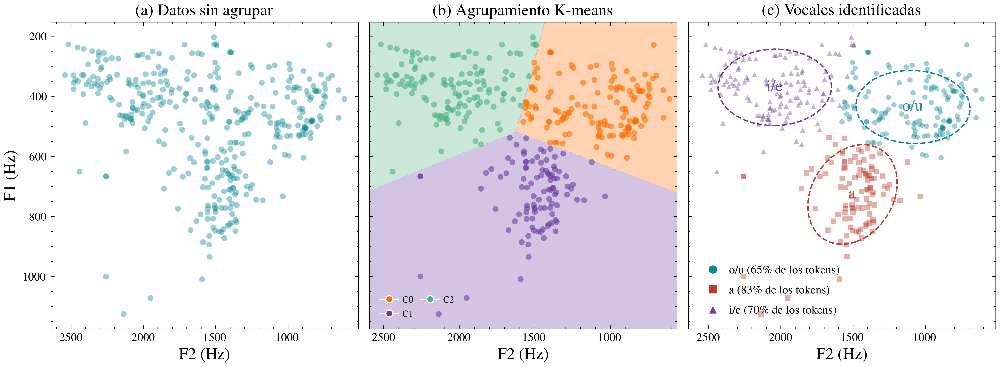

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Ellipse
from matplotlib.colors import ListedColormap

# ---------- Paletas y etiquetas ----------
palette_clusters = [
    '#FF6D00', '#6B3FA0', '#4cb27f', '#0e8794',
    '#C0392B', '#E67E22', '#2979FF',
]

labels_vocales  = {0: 'o/u', 1: 'a', 2: 'i/e'}
palette_vocales = {0: '#0e8794', 1: '#C0392B', 2: '#6B3FA0'}
markers_vocales = {0: 'o', 1: 's', 2: '^'}


# ---------- Elipse de confianza ----------
def confidence_ellipse(x, y, ax, n_std=1.5, **kwargs):
    cov = np.cov(x, y)
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    angle = np.degrees(np.arctan2(*vecs[:, 0][::-1]))
    width, height = 2 * n_std * np.sqrt(vals)
    ellipse = Ellipse(xy=(np.mean(x), np.mean(y)),
                      width=width, height=height, angle=angle, **kwargs)
    ax.add_patch(ellipse)

# ---------- Fracción de tokens dentro de la elipse ----------
def fraction_inside_ellipse(x, y, n_std):
    data = np.vstack([x, y])
    cov = np.cov(data)
    inv_cov = np.linalg.inv(cov)
    mean = np.array([np.mean(x), np.mean(y)])
    diffs = data.T - mean  # cada fila es un punto centrado
    # distancia de Mahalanobis al cuadrado para cada punto
    m_dist_sq = np.einsum('ij,jk,ik->i', diffs, inv_cov, diffs)
    inside = m_dist_sq <= n_std**2
    return inside.mean()

# ---------- Figura combinada ----------
with plt.style.context(['science', 'ieee']):

    fig, (ax1, ax2, ax3) = plt.subplots(
        1, 3, figsize=(12, 4.5), sharey=True
    )

    # ===== (a) Distribución cruda =====
    ax1.scatter(df_formants['F2'], df_formants['F1'],
                s=25, alpha=0.4, color='#0e8794', linewidths=0)
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel('F2 (Hz)', fontsize=14)
    ax1.set_ylabel('F1 (Hz)', fontsize=14)
    ax1.set_title('(a) Datos sin agrupar', fontsize=14)

    # ===== (b) Clusters de K-means con frontera =====
    f1_min, f1_max = df_formants['F1'].min() - 50, df_formants['F1'].max() + 50
    f2_min, f2_max = df_formants['F2'].min() - 50, df_formants['F2'].max() + 50

    xx, yy  = np.meshgrid(np.linspace(f1_min, f1_max, 400),
                          np.linspace(f2_min, f2_max, 400))
    grid    = np.c_[xx.ravel(), yy.ravel()]
    grid_sc = scaler.transform(grid)
    zz      = km.predict(grid_sc).reshape(xx.shape)

    cmap_bg = ListedColormap([p + '33' for p in palette_clusters[:7]])
    ax2.contourf(yy, xx, zz, levels=np.arange(-0.5, 7, 1),
                 cmap=cmap_bg, alpha=0.3)

    handles_clusters = []
    for cluster_id in sorted(df_formants['cluster'].unique()):
        sub   = df_formants[df_formants['cluster'] == cluster_id]
        color = palette_clusters[cluster_id % len(palette_clusters)]
        ax2.scatter(sub['F2'], sub['F1'], s=25, alpha=0.6,
                    color=color, linewidths=0)
        handles_clusters.append(
            Line2D([0], [0], marker='o', color='w',
                   markerfacecolor=color, markersize=6,
                   label=f'C{cluster_id}')
        )

    ax2.invert_xaxis()
    ax2.set_xlabel('F2 (Hz)', fontsize=14)
    ax2.set_title('(b) Agrupamiento K-means', fontsize=14)
    ax2.legend(handles=handles_clusters,
               fontsize=8, framealpha=0.5, markerscale=1,
               loc='lower left', ncol=2,
               borderpad=0.6, labelspacing=0.6,
               handletextpad=0.4, columnspacing=0.8)

    # ===== (c) Espacio vocálico identificado =====
    handles_vocales = []
    for cluster_id, vocal in labels_vocales.items():
        sub   = df_formants[df_formants['cluster'] == cluster_id]
        color = palette_vocales[cluster_id]
        cx, cy = sub['F2'].mean(), sub['F1'].mean()

        ax3.scatter(sub['F2'], sub['F1'], s=20, alpha=0.4,
                    color=color, marker=markers_vocales[cluster_id],
                    linewidths=0)
        confidence_ellipse(sub['F2'].values, sub['F1'].values, ax3,
                           n_std=1.5, edgecolor=color, facecolor='none',
                           linewidth=1.2, linestyle='--')
        ax3.text(cx, cy, vocal, fontsize=14, fontweight='bold',
                 color=color, ha='center', va='center', alpha=0.9)
        
        # --- calcular porcentaje de tokens dentro de la elipse ---
        frac = fraction_inside_ellipse(sub['F2'].values, sub['F1'].values, n_std=1.5) * 100

        handles_vocales.append(
            Line2D([0], [0], marker=markers_vocales[cluster_id], color='w',
                   markerfacecolor=color, markersize=8,
                   label=f"{vocal} ({frac:.0f}\\% de los tokens)")
        )

    ax3.invert_xaxis()
    ax3.set_xlabel('F2 (Hz)', fontsize=14)
    ax3.set_title('(c) Vocales identificadas', fontsize=14)
    ax3.legend(handles=handles_vocales, fontsize=10, framealpha=0.5,
               labelspacing=0.8, loc='lower left',
               borderpad=0.6, handletextpad=0.4)

    for ax in (ax1, ax2, ax3):
        ax.tick_params(labelsize=10)

    plt.tight_layout()
    plt.savefig("./figures/vowel_space_combined.svg", bbox_inches='tight')
    plt.show()